**<h1 align=center><font size = 5>Geometric Operations and Mathematical Tools with OpenCV Library</font></h1>**

<br>

<img src="https://media.istockphoto.com/vectors/geometry-tools-vector-id165791098?k=20&m=165791098&s=612x612&w=0&h=5oG1bmDSPBhukm-BWf6N58lLkrXXTOfO3c_JweNM0Sw=" width="1000" height="500" alt="istock" alt="istock">

<small>Picture Source:<a href="https://media.istockphoto.com/vectors/geometry-tools-vector-id165791098?k=20&m=165791098&s=612x612&w=0&h=5oG1bmDSPBhukm-BWf6N58lLkrXXTOfO3c_JweNM0Sw=">istock</a>

<br>

<h2>Description</h2>

<p>Spatial operations use  pixels in a neighborhood to determine the present pixel value. Applications include filtering and sharpening. They are used in many steps in computer vision like segmentation and are a key building block in Artificial Intelligence algorithms.</p>

<br>

<h2>Objective:</h2>

<ul>
  <li>Making linear filtering on image.</li>
  <li>Filtering noise on image.</li>
  <li>Apply Gaussian blur on image.</li>
  <li>Sharpening the image.</li>
  <li>Use median filters.</li>
</ul>

<br>

<h2>Keywords</h2>

<ul>
  <li>Geometric operations</li>
  <li>OpenCV</li>
  <li>Mathematical Tools</li>
  <li>Gaussian blur</li>
  <li>Linear filtering</li>
  <li>Median</li>
</ul>

<br>

# Objective for this Notebook

<p>Within the scope of this project, we tried to make geometric operations to manuplate the image with OpenCV library.</p>

<div class="alert alert-block alert-info" style="margin-top: 20px">
<li><a href="https://#importing_libraries">Importing Libraries</a></li>
<li><a href="https://#linear_filtering">Linear Filtering</a></li>
<li><a href="https://#filtering_noise">Filtering Noise</a></li>
<li><a href="https://#gaussian_blur">Gaussian Blur</a></li>
<li><a href="https://#image_sharpening">Image Sharpening</a></li>
<li><a href="https://#edges">Edges</a></li>
<li><a href="https://#median">Median</a></li>
<li><a href="https://#threshold_function">Threshold Function</a></li>
<br>

<p></p>
Estimated Time Needed: <strong>20 min</strong>
</div>

<br>

<a id="importing_libraries"></a>

<h2 align=center>Importing Libraries</h2>

<p>Let's import the following libraries</p>


In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

<p>This function will plot two images side by side.</p>


In [ ]:
def plot_image(im_1, im_2, title_1="Original Image", title_2="New Image"):
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(im_1, cv2.COLOR_BGR2RGB))
    plt.title(title_1)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(im_2, cv2.COLOR_BGR2RGB))
    plt.title(title_2)
    plt.show()

<p>Spatial operations use the nanoring pixels to determine the present pixel value.</p>


<br>

<a id="linear_filtering"></a>

<h2 align=center>Linear Filtering</h2>


<p>Filtering involves improving an image, for example removing Noise from an image. Noise is caused by a bad camera or bad image compression. Noise-causing factors can cause blurry images, we can apply filters to sharpen these images. Convolution is a standard way of Filtering an image, filter is called kernel and different kernels perform different tasks. Also, Convolution is used for most of the most advanced AI algorithms. We take the dot product of the kernel and as an equal sized part of the image. Then we shift the kernel and repeat.</p>


[[[210 145  94]
  [210 145  94]
  [210 145  94]
  ...
  [217 156 112]
  [206 145 101]
  [200 139  95]]

 [[210 145  94]
  [210 145  94]
  [210 145  94]
  ...
  [206 145 101]
  [204 143  99]
  [215 154 110]]

 [[210 145  94]
  [210 145  94]
  [210 145  94]
  ...
  [199 138  94]
  [210 149 105]
  [235 174 130]]

 ...

 [[164 138 122]
  [159 133 117]
  [156 130 114]
  ...
  [156 133 118]
  [162 139 124]
  [167 144 129]]

 [[169 143 127]
  [164 138 122]
  [161 135 119]
  ...
  [152 129 114]
  [157 134 119]
  [161 138 123]]

 [[167 141 125]
  [163 137 121]
  [162 136 120]
  ...
  [148 125 110]
  [152 129 114]
  [156 133 118]]]


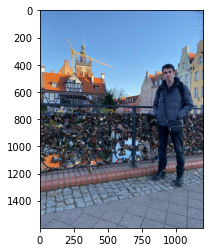

In [ ]:
image_original = cv2.imread("me.jpg")
print(image_original)
# Converts the order of the color from BGR to RGB
plt.imshow(cv2.cvtColor(image_original, cv2.COLOR_BGR2RGB))

<p>The images we are working with are comprised of RGB values which are values from <i>0</i> to <i>255</i>.</p>

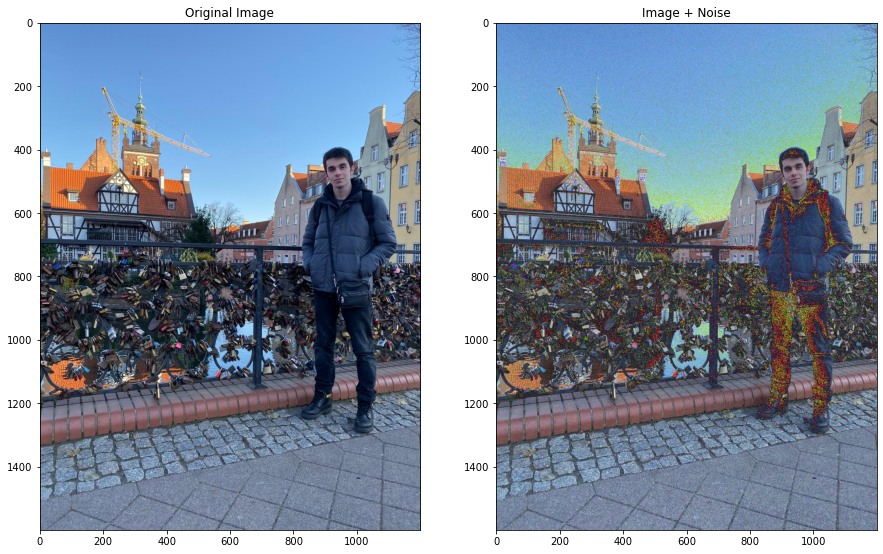

In [ ]:
# Creating noise for the picture
rows, cols, _ = image_original.shape
noise = np.random.normal(0, 16, (rows, cols, 3)).astype(np.uint8)
noisy_image = image_original + noise

# Plotting the original image and the noisy image
plot_image(image_original, noisy_image, title_1="Original Image", title_2="Image + Noise")

<p>You can easily add noise your image:</p>

In [ ]:
# your_image_original = cv2.imread("your_image_name")
# print(your_image_original)
# plt.imshow(cv2.cvtColor(your_image_original, cv2.COLOR_BGR2RGB))

# rows, cols, _ = image_original.shape
# noise = np.random.normal(0, 16, (rows, cols, 3)).astype(np.uint8)
# noisy_image = image_original + noise
# plot_image(image_original, noisy_image, title_1="Original Image", title_2="Image + Noise")

<br>

<a id="filtering_noise"></a>

<h2 align=center>Filtering Noise</h2>



<p>Smoothing filters average out the Pixels within a neighborhood, they are sometimes called low pass filters.

Create a kernel which is a <i>7</i> by <i>7</i> array where each value is <i>1/49</i>:</p>

In [ ]:
kernel = np.ones((7, 7)) / 49

<p>The function <code>filter2D</code> performs 2D convolution between the image <code>src</code> and the  <code>kernel</code> on each color channel independently. The parameter <a href="https://docs.opencv.org/master/d4/d86/group__imgproc__filter.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01#filter_depths">ddepth</a> has to do with the size of the output image, we will set it to -1 so the input and output are the same size.</p>


In [ ]:
filtered_image = cv2.filter2D(src=noisy_image, ddepth=-1, kernel=kernel)

<p>We can plot the image before and after the filtering; we see the noise is reduced, but the image is blurry:</p>


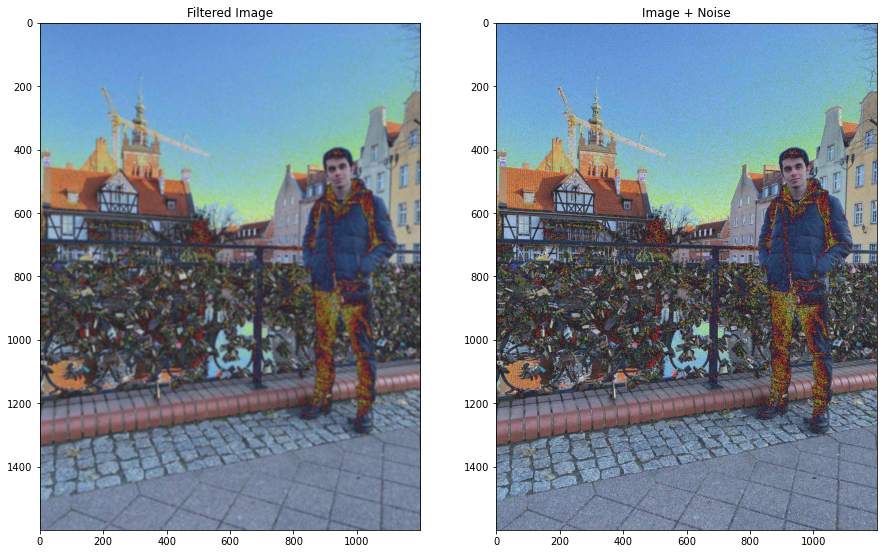

In [ ]:
plot_image(filtered_image, noisy_image, title_1="Filtered Image", title_2="Image + Noise")

<p>Here we create a kernel which is a <i>8</i> by <i>8</i> array where each value is <i>1/64</i>.</p>


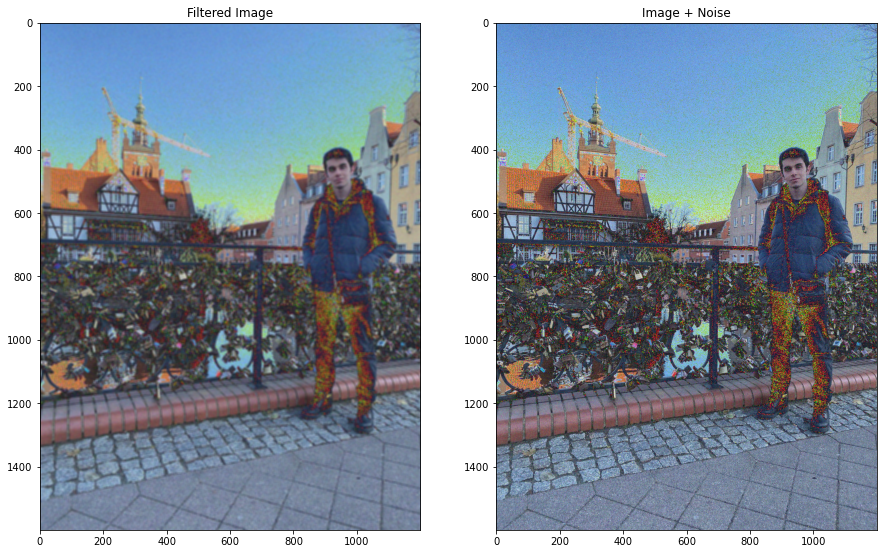

In [ ]:
kernel = np.ones((8, 8)) / 64
filtered_image = cv2.filter2D(src=noisy_image, ddepth=-1, kernel=kernel)
# Plots the Filtered and Image with Noise using the function defined at the top
plot_image(filtered_image, noisy_image, title_1="Filtered Image", title_2="Image + Noise")

<br>

<a id="gaussian_blur"></a>

<h2 align=center>Gaussian Blur</h2>




<p>The function  <code>GaussianBlur</code> convolves the source image with the specified Gaussian kernel It filters noise but does a better job of preserving the edges. It has the following parameters:</p>


<p>Parameters:

<code>src</code> input image; the image can have any number of channels, which are processed independently

<code>ksize:</code> Gaussian kernel size

<code>sigmaX</code> Gaussian kernel standard deviation in the X direction

<code>sigmaY</code> Gaussian kernel standard deviation in the Y direction; if sigmaY is zero, it is set to be equal to sigmaX 

<br>

Let's filter the images using GaussianBlur on the image with noise using a 4 by 4 kernel</p>

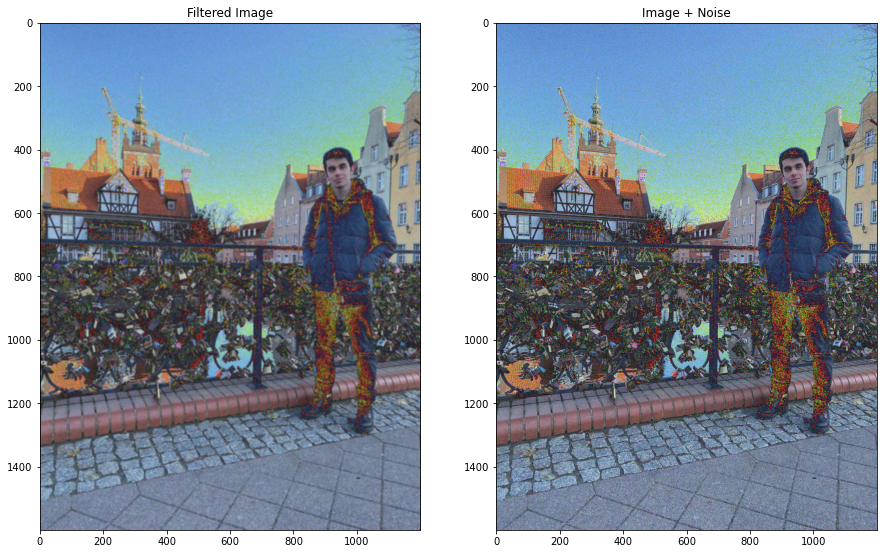

In [ ]:
filtered_image = cv2.GaussianBlur(noisy_image, (5, 5), sigmaX=4, sigmaY=4)
# Plots the Filtered Image then the Unfiltered Image with Noise
plot_image(filtered_image, noisy_image, title_1="Filtered Image", title_2="Image + Noise")

<p>Sigma behaves like the size of the mean filter, a larger value of sigma will make the image blurry.</p>

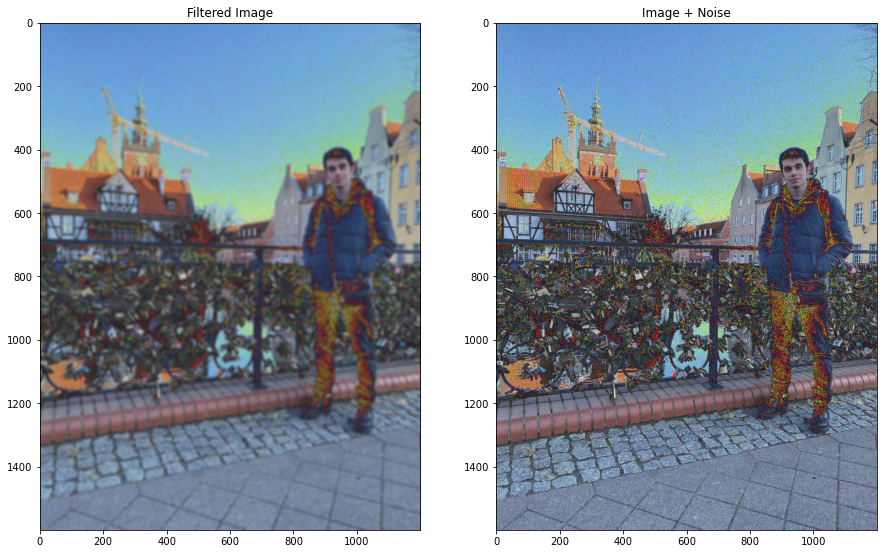

In [ ]:
filtered_image = cv2.GaussianBlur(noisy_image, (11, 11), sigmaX=15, sigmaY=15)
plot_image(filtered_image, noisy_image, title_1="Filtered Image", title_2="Image + Noise")

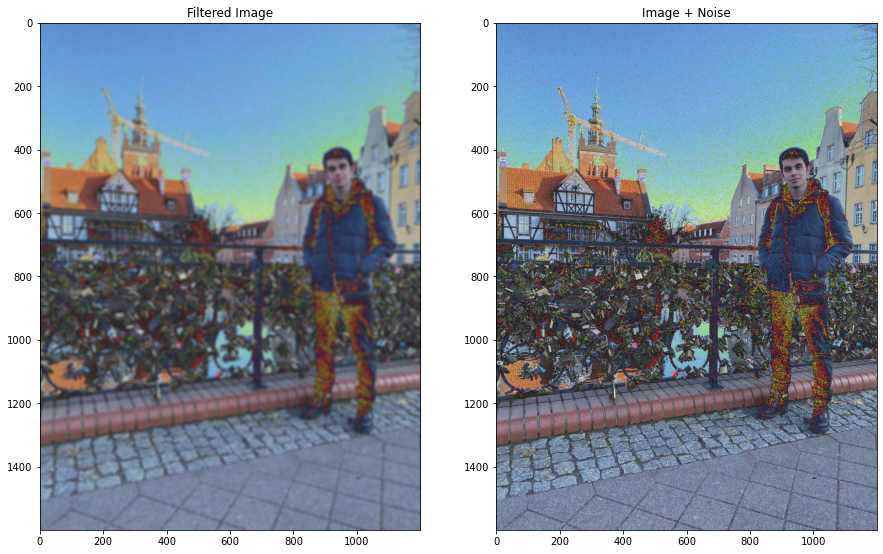

In [ ]:
filtered_image = cv2.GaussianBlur(noisy_image, (11, 11), sigmaX=60, sigmaY=60)
plot_image(filtered_image, noisy_image, title_1="Filtered Image", title_2="Image + Noise")

<br>

<a id="image_sharpening"></a>

<h2 align=center>Image Sharpening</h2>


<p>Image Sharpening  involves smoothing the image and calculating the derivatives.  We can accomplish image sharpening by applying the following Kernel.</p>


<p>Image sharpening matrix:</p>

\begin{bmatrix}
\ \ -1 & \ \ -1 & \ \ -1 \\\\
\ \ -1 & \ \ 9 & \ \ -1 \\\\
-1 & -1 & -1
\end{bmatrix}

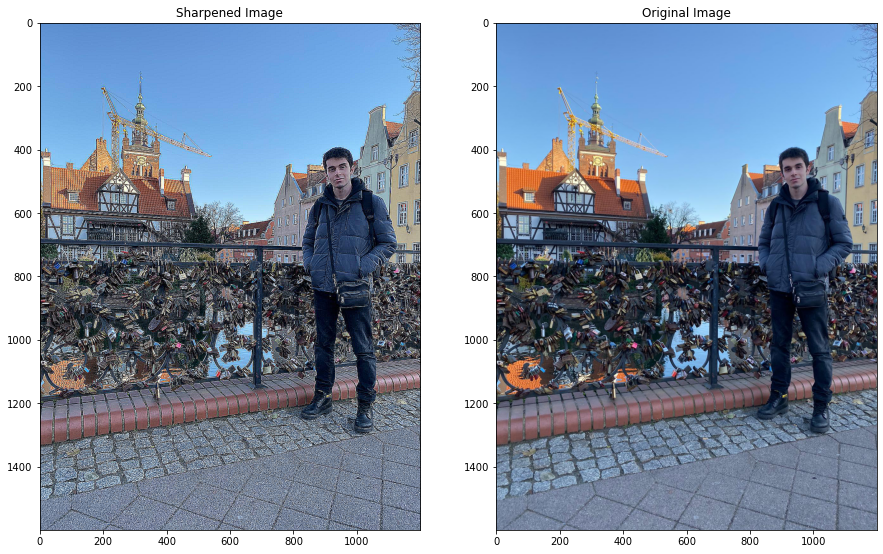

In [ ]:
# Common Kernel for image sharpening
kernel = np.array([[-1, -1, -1],
                   [-1, 9, -1],
                   [-1, -1, -1]])

# Applys the sharpening filter using kernel on the original image without noise
sharpened_image = cv2.filter2D(image_original, -1, kernel)
# Plots the sharpened image and the original image without noise
plot_image(sharpened_image, image_original, title_1="Sharpened Image", title_2="Original Image")

<p>You can easily sharpen your image:</p>


In [ ]:
# your_image = cv2.imread("your_image_name")
# print(your_image)

# plt.imshow(cv2.cvtColor(your_image, cv2.COLOR_BGR2RGB))
# your_sharpened_image = cv2.filter2D(your_image, -1, kernel)
# plt.imshow(cv2.cvtColor(your_sharpened_image, cv2.COLOR_BGR2RGB))

<br>

<a id="edges"></a>

<h2 align=center>Edges</h2>


<p>Edges are where pixel intensities change. The Gradient of a function outputs the rate of change; we can approximate the gradient of a grayscale image with convolution. There are several methods to approximate the gradient, let’s use the Sobel edge detector. Consider the following image:</p>


[[137 137 137 ... 150 139 133]
 [137 137 137 ... 139 137 148]
 [137 137 137 ... 132 143 168]
 ...
 [136 131 128 ... 131 137 142]
 [141 136 133 ... 127 132 136]
 [139 135 134 ... 123 127 131]]


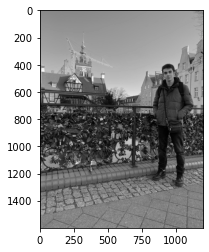

In [ ]:
img_gray = cv2.imread('me.jpg', cv2.IMREAD_GRAYSCALE)
print(img_gray)
plt.imshow(img_gray, cmap='gray')

<p>We smooth the image, this decreases changes that may be caused by noise that would  affect the gradient. Let's filter the image using GaussianBlur on the image with noise using a 3 by 3 kernel:</p>


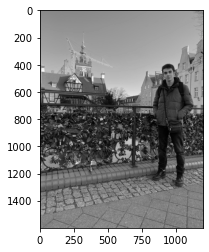

In [ ]:
img_gray = cv2.GaussianBlur(img_gray, (3, 3), sigmaX=0.1, sigmaY=0.1)
plt.imshow(img_gray, cmap='gray')

We can approximate the derivative in the X or Y direction  using the <code>Sobel</code> function, here are the parameters:


<p><code>src</code>: input image</p>
<p><code>ddepth</code>: output image depth, see combinations; in the case of 8-bit input images it will result in truncated derivatives</p>
<p><code>dx</code>: order of the derivative x</p>
<p><code>dx</code>: order of the derivative y</p>
<p><code>ksize</code> size of the extended Sobel kernel; it must be 1, 3, 5, or 7</p>


<p><i>dx = 1</i> represents the derivative in the <i>x-direction</i>.  The function approximates  the derivative by  convolving   the image with the following kernel</p>


\begin{bmatrix}
1 & 0 & -1 \\\\
2 & 0 & -2 \\\\
1 & 0 & -1
\end{bmatrix}


<p>Let's apply the function:</p>


In [ ]:
ddepth = cv2.CV_16S
grad_x = cv2.Sobel(src=img_gray, ddepth=ddepth, dx=1, dy=0, ksize=3)

<i>Let's plot the result</p>


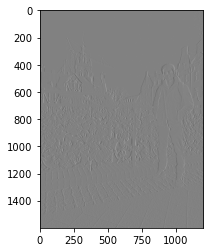

In [ ]:
plt.imshow(grad_x, cmap='gray')

<p><i>dy=1</i> represents the derivative in the <i>y-direction</i>.  The function approximates  the derivative by  convolving.

The image with the following kernel:</p>


\begin{bmatrix}
\ \ 1 & \ \ 2 & \ \ 1 \\\\
\ \ 0 & \ \ 0 & \ \ 0 \\\\
-1 & -2 & -1
\end{bmatrix}


<p>Let's apply the filter on the image in the X direction:</p>

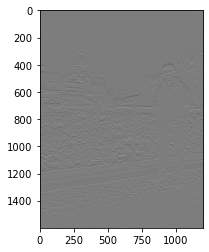

In [ ]:
grad_y = cv2.Sobel(src=img_gray, ddepth=ddepth, dx=0, dy=1, ksize=3)
plt.imshow(grad_y, cmap='gray')

<p>We can approximate the  gradient by  calculating absolute values, and converts the result to 8-bit:</p>


In [ ]:
abs_grad_x = cv2.convertScaleAbs(grad_x)
abs_grad_y = cv2.convertScaleAbs(grad_y)

<p>Furthermore, let's apply <code>addWeighted</code> to calculatede the sum of two arrays.</p>

In [ ]:
grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

<p>We then plot the results, we see the image with lines have high-intensity values representing a large  gradient.</p>


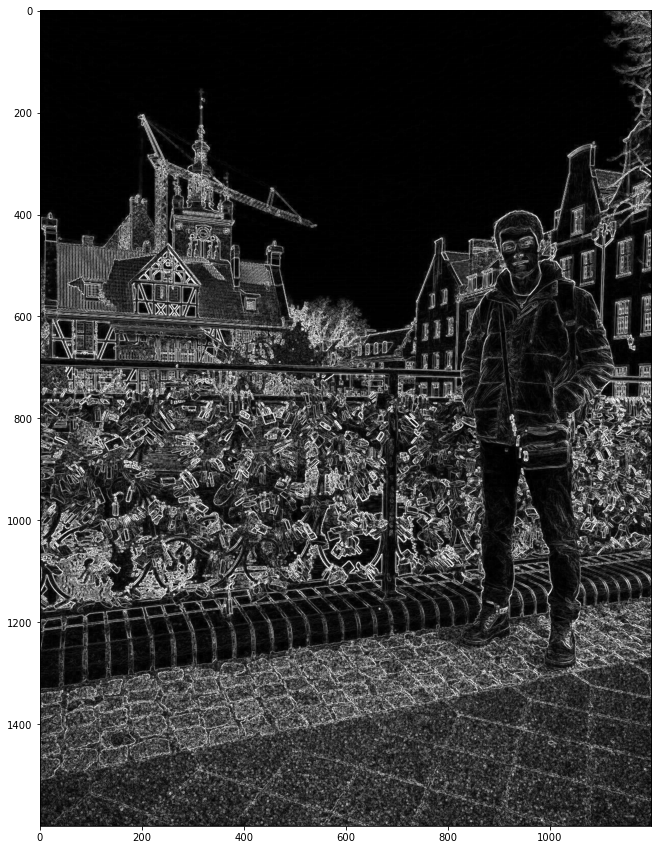

In [ ]:
plt.figure(figsize=(15, 15))
plt.imshow(grad, cmap='gray')

<p>You can easily change edges on your image:</p>

In [ ]:
# img_gray = cv2.imread('your_image_name', cv2.IMREAD_GRAYSCALE)
# print(img_gray)
# plt.imshow(grad_y, cmap='gray')

# img_gray = cv2.GaussianBlur(img_gray, (3, 3), sigmaX=0.1, sigmaY=0.1)
# plt.imshow(grad_y, cmap='gray')

# ddepth = cv2.CV_16S
# grad_x = cv2.Sobel(src=img_gray, ddepth=ddepth, dx=1, dy=0, ksize=3)
# plt.imshow(grad_x, cmap='gray')

# abs_grad_x = cv2.convertScaleAbs(grad_x)
# abs_grad_y = cv2.convertScaleAbs(grad_y)
# grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
# plt.figure(figsize=(15, 15))
# plt.imshow(grad, cmap='gray')

<br>

<a id="median"></a>

<h2 align=center>Median</h2>

Median filters find the median of all the pixels under the kernel area and the central element is replaced with this median value. The median filter is a non-linear digital filtering technique, often used to remove noise from an image or signal. To learn more please check [Wikipedia](https://en.wikipedia.org/wiki/Median_filter#:~:text=The%20median%20filter%20is%20a,edge%20detection%20on%20an%20image).


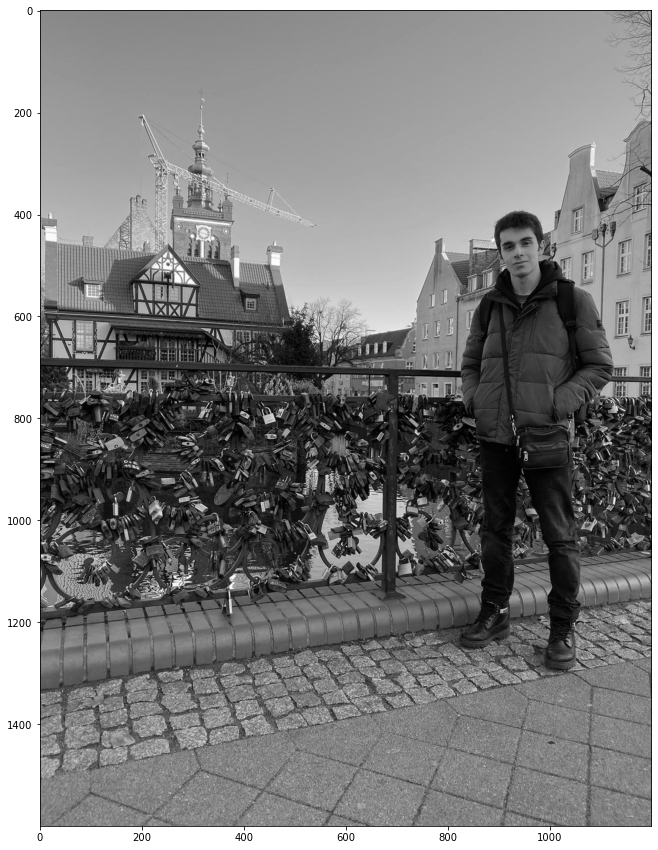

In [ ]:
image = cv2.imread("me.jpg", cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(15, 15))
plt.imshow(image, cmap="gray")

<p>Now let's apply a Median Filter by using the <code>medianBlur</code> function.</p>


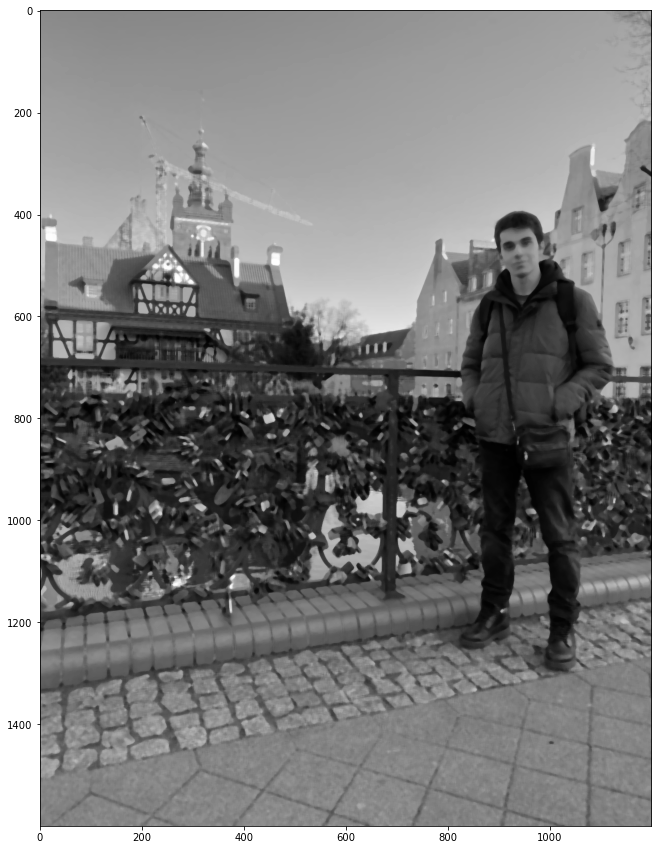

In [ ]:
# Let's set the kernel size to 7 and plot the picture.
# The more you increase kernel size, the more the blur effect will be applied to the image.
filtered_image = cv2.medianBlur(image, 7)
plt.figure(figsize=(15, 15))
plt.imshow(filtered_image, cmap="gray")

<p>You can easily use median filters on your image:</p>

In [ ]:
# image_your = cv2.imread("your_image_name", cv2.IMREAD_GRAYSCALE)
# print(your_image)

# kernel = 3
# your_filtered_image = cv2.medianBlur(image_your, kernel)
# plt.figure(figsize=(15, 15))
# plt.imshow(your_filtered_image, cmap="gray")

<br>

<a id="threshold_function"></a>

<h2 align=center>Threshold Function</h2>

<p>A threshold function is a Boolean function that determines whether a value equality of its inputs exceeded a certain threshold.</p>

<p><code>src</code>: The image to use</p>

<p><code>thresh</code>: The threshold</p>

<p><code>maxval</code>: The maxval to use</p>

<p><code>type</code>: Type of filtering</p>


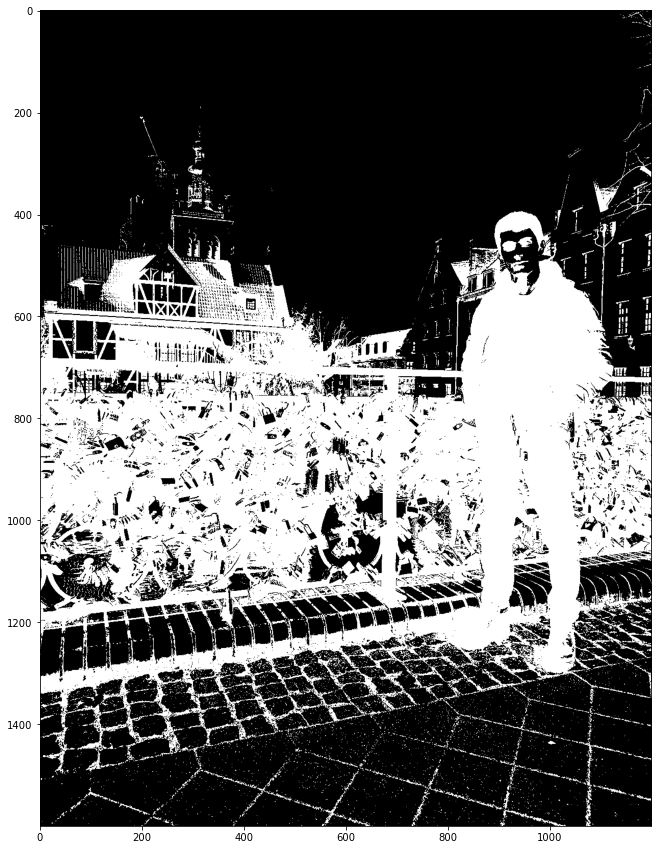

In [ ]:
rets, outs = cv2.threshold(src=image, thresh=0, maxval=255, type=cv2.THRESH_OTSU + cv2.THRESH_BINARY_INV)

plt.figure(figsize=(15, 15))
plt.imshow(outs, cmap='gray')

<p>You can easily use treshold funtion on your image:</p>

In [ ]:
# your_image = cv2.imread("your_image_name")
# print(your_image)

# rets, outs = cv2.threshold(src=your_image, thresh=0, maxval=255, type=cv2.THRESH_OTSU + cv2.THRESH_BINARY_INV)
# plt.figure(figsize=(15, 15))
# plt.imshow(outs, cmap='gray')

# References


\[1] [Joseph Santarcangelo](https://www.linkedin.com/in/joseph-s-50398b136/?utm_medium=Exinfluencer&utm_source=Nurture&utm_content=000026UJ&utm_term=10006555&utm_id=SkillsNetwork-Courses-IBMDeveloperSkillsNetwork-CV0101EN-Coursera-25797139&utm_email=Email&utm_campaign=PLACEHOLDER) has a PhD in Electrical Engineering, his research focused on using machine learning, signal processing, and computer vision to determine how videos impact human cognition. Joseph has been working for IBM since he completed his PhD.

\[2]  Images were taken from: [https://homepages.cae.wisc.edu/\~ece533/images/](https://homepages.cae.wisc.edu/\~ece533/images/?utm_medium=Exinfluencer&utm_source=Nurture&utm_content=000026UJ&utm_term=10006555&utm_id=SkillsNetwork-Courses-IBMDeveloperSkillsNetwork-CV0101EN-Coursera-25797139&utm_email=Email&utm_campaign=PLACEHOLDER)

\[3]  <a href='https://pillow.readthedocs.io/en/stable/index.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01'>Pillow Docs</a>

\[4]  <a href='https://opencv.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01'>Open CV</a>

\[5] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).

\[6] Jian, Wushuai, Xueyan Sun, and Shuqian Luo. "Computer-aided diagnosis of breast microcalcifications based on dual-tree complex wavelet transform." Biomedical engineering online 11.1 (2012): 1-12.


<br>

<h1>Contact Me<h1>
<p>If you have something to say to me please contact me:</p>

<ul>
  <li>Twitter: <a href="https://twitter.com/Doguilmak">Doguilmak</a></li>
  <li>Mail address: doguilmak@gmail.com</li>
</ul>

In [1]:
from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Changes have been made to the project on 2022-11-03 00:31:49
